## Decision Tree

<b> Table of Contents: </b>
<b> Target Variable: Death Rate Categories </b>
<br> [1.0 Basic Model Decision Tree Classifier - Case Rate](#123)
<br> [Visualizing Decision Tree Classification](#4321)
<br> [1.1 Oversampling (SMOTE)](#1234)
<br> [1.2 Cross Validation (Oversampling)](#12345)
<br> [1.3 Cross Validation (Undersampling)](#123456)
<br> [2.0 Basic Model Decision Tree Classifier - Death Rate](#1234567)
<br> [Visualizing Decision Tree Classification](#54321)
<br> [2.1 Oversampling (SMOTE)](#12345678)
<br> [2.2 Cross Validation (Oversampling)](#123456789)
<br> [2.3 Cross Validation (Undersampling)](#1234567891)


In [1]:
# import modules
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
import os
import matplotlib.pyplot as plt
from sklearn import tree, metrics

import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics

from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler 
from sklearn.metrics import confusion_matrix, classification_report 
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss 

# Cross Validation packages
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


# for plotting
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# import module for gridsearch (to find optimal hyper-parameters)
from sklearn.model_selection import GridSearchCV

# import module (to test execution time of a codeblock to run)
import time

import warnings

from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC

/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)
/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.base module is  deprecated in version 0.22 and will be removed in

In [2]:
# packages for Receiver Operating Characteristic (ROC) with cross validation
# source: https://scikit-learn.org/0.18/auto_examples/model_selection/plot_roc_crossval.html
print(__doc__)

import numpy as np
from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import plot_roc_curve

Automatically created module for IPython interactive environment


# Basic Model - Target Variable 'Case Rate Categories'

In [3]:
df = pd.read_csv("final_case_data.csv")
df.head()

,Total Population,Total Citizen Income,Hispanic or Latino,Total Citizen Educated in US,Total Households,White Race,Total Families,Citizen College Degree,Citizen Some College Education,Citizen Income over 75000,Citizen High School Graduate,Citizen No Income,Pacific Islander Race,Citizen Graduate or Professional Degree,Citizen Income 1-9999,Citizen Less than High School Education,Citizen Income 15000-24999,Citizen Income 15000-24999.1,Citizen Income 35000-49999,Case Rate Categories
0,54571,44109,53261,36757,20221,9643,14613,5316,10697,5298,12363,6377,466,3860,6955,4521,6000,6000,5727,2
1,182265,166364,174273,143022,73180,17105,41898,29237,45286,17954,39771,20201,3631,14731,25080,13997,26852,26852,21502,2
2,27457,21627,26070,18434,9820,12875,6015,1403,4707,1019,6549,3968,894,815,5090,4960,3419,3419,1820,3
3,22915,18743,22509,15859,7953,5047,5201,1289,3971,953,6958,4170,185,808,3268,2833,2926,2926,1860,2
4,57322,46501,52696,39475,21578,761,14106,3416,13583,2690,12740,10165,2347,1756,6561,7980,6956,6956,5639,2


In [4]:
df.dtypes

Total Population                            int64
Total Citizen Income                        int64
Hispanic or Latino                          int64
Total Citizen Educated in US                int64
Total Households                            int64
White Race                                  int64
Total Families                              int64
Citizen College Degree                      int64
Citizen Some College  Education             int64
Citizen Income over 75000                   int64
Citizen High School  Graduate               int64
Citizen No Income                           int64
Pacific Islander Race                       int64
Citizen Graduate or Professional Degree     int64
Citizen Income 1-9999                       int64
Citizen Less than High School  Education    int64
Citizen Income 15000-24999                  int64
Citizen Income 15000-24999.1                int64
Citizen Income 35000-49999                  int64
Case Rate Categories                        int64


In [5]:
# trim the spaces of the cells from the csv file
df.columns = df.columns.to_series().apply(lambda x: x.strip())

In [6]:
# need to change int64 to cat type for target vars
df['Case Rate Categories'] = df['Case Rate Categories'].astype('category')

In [7]:
df['Total Population'] = df['Total Population'].astype('int')

In [8]:
#df.dtypes
#check to see if types changed to cat -- YES

<a id = "123"> <h2> 1.0 Basic Model Decision Tree Classifier </h2> </a>

__Build the Model__

# Target Variable is 'Case Rate Categories'

In [9]:
feature_cols = ['Total Population','Total Citizen Income','Hispanic or Latino','Total Citizen Educated in US',
                                    'Total Households','White Race','Total Families','Citizen College Degree','Citizen Some College  Education',
                                    'Citizen Income over 75000','Citizen High School  Graduate',
                                    'Citizen No Income','Pacific Islander Race','Citizen Graduate or Professional Degree',
                                    'Citizen Income 1-9999','Citizen Less than High School  Education',
                                     'Citizen Income 15000-24999','Citizen Income 15000-24999','Citizen Income 35000-49999']

class_name=['0','1','2','3','4','5']

In [10]:
# define dependent and independent variables
X = df.iloc[:, :-1] # Features is all columns in the dataframe except the last column
Y = df.iloc[:, -1] # Target is the last column in the dataframe: 'Case Rate Categories'

In [11]:
# Split dataset into training set and test set 
# 70% training and 30% test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=2019)

In [12]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [13]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.49575371549893843


In [14]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.43      0.50      0.46        40
           1       0.61      0.63      0.62       431
           2       0.47      0.44      0.45       352
           3       0.19      0.21      0.20        75
           4       0.09      0.09      0.09        23
           5       0.07      0.05      0.06        21

    accuracy                           0.50       942
   macro avg       0.31      0.32      0.31       942
weighted avg       0.49      0.50      0.49       942



In [15]:
print(metrics.confusion_matrix(y_test, y_pred))

[[ 20  16   4   0   0   0]
 [ 16 273 121  13   6   2]
 [ 10 126 155  47   9   5]
 [  0  20  33  16   4   2]
 [  1   3   8   4   2   5]
 [  0   7   9   3   1   1]]


---
<a id = "4321"> <h2> Visualizing the Decision Tree Classification - Case Rate Categories </h2> </a>

In [16]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols, class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('caserate.png')
Image(graph.create_png())


/opt/tljh/user/lib/python3.6/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.583822 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.583822 to fit



# Take Away 
- Need to prune the tree to optimize decision tree performance 

In [17]:
# Create Decision Tree classifer object
clf2 = DecisionTreeClassifier(criterion="entropy",max_depth=4)

# Train Decision Tree Classifer
clf2 = clf2.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf2.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))



Accuracy: 0.578556263269639


In [18]:
print(metrics.confusion_matrix(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred))

[[ 20  19   1   0   0   0]
 [  7 365  59   0   0   0]
 [  7 184 160   0   0   1]
 [  0  22  53   0   0   0]
 [  1   3  17   0   0   2]
 [  0  10  11   0   0   0]]
              precision    recall  f1-score   support

           0       0.57      0.50      0.53        40
           1       0.61      0.85      0.71       431
           2       0.53      0.45      0.49       352
           3       0.00      0.00      0.00        75
           4       0.00      0.00      0.00        23
           5       0.00      0.00      0.00        21

    accuracy                           0.58       942
   macro avg       0.28      0.30      0.29       942
weighted avg       0.50      0.58      0.53       942



/opt/tljh/user/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


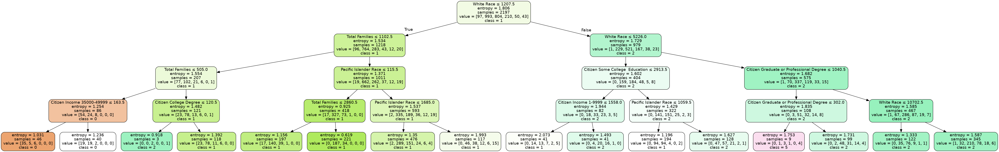

In [19]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('caserate-pruned.png')
Image(graph.create_png())

# Take Away
- Accuracy increased from 0.4564 to 0.5478 after pruning the tree using the criterion "entroy" to increase the information gain and setting the max depth to 3, meaning only 3 levels of the tree will be printed. Overall, the accuracy increased as a result of pruning and the viewer longer has to zoom-in to read the tree.

<a id = "1234"> <h2> 1.1 Oversampling (SMOTE) </h2> </a>
We oversample the <b> training </b> dataset, because the classes within our target variable 'Revenue' are imbalanced:
* class 0: 84.53%
* class 1: 15.47%

Fore more information, click on detailed information from Prof. Jie Tao [link](https://github.com/DrJieTao/ba545-docs/blob/master/competition2/handling_imbalanced_data_part2.ipynb)

In [20]:
# Split dataset into training set and test set 
# 70% training and 30% test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=2019) 

sm = SMOTE(random_state = 2019) 
X_train_res, y_train_res = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

After OverSampling, the shape of train_X: (5958, 19)
After OverSampling, the shape of train_y: (5958,) 

After OverSampling, counts of label '1': 993
After OverSampling, counts of label '0': 993


/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/opt/tljh/user/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, cate

The SMOTE Algorithm has oversampled the instances in the minority class and made it equal to majority class:
* Both classes (0 & 1) now have 7291 instances, the <b> training </b> dataset is balanced.
* Class 1 increased from 1340 instances to 7291 instances, an increase of 5951 instances of class 1.

In [21]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train_res, y_train_res)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# print classification report 
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.33      0.53      0.41        40
           1       0.65      0.55      0.59       431
           2       0.47      0.39      0.43       352
           3       0.18      0.29      0.22        75
           4       0.13      0.26      0.18        23
           5       0.20      0.48      0.28        21

    accuracy                           0.46       942
   macro avg       0.33      0.42      0.35       942
weighted avg       0.51      0.46      0.48       942



## Cross Validation Using KFold </b>
For more information on the topic, please click the following [link](https://stackabuse.com/cross-validation-and-grid-search-for-model-selection-in-python/).
<br> The details of the package are noted [here](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html).

<a id = "12345"> <h2> 1.2 Cross Validation (Oversampling)  </h2> </a>

In [22]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
#result = cross_val_score(gnb, X, Y, cv=kfold, scoring='accuracy')
result = cross_val_score(clf, X_train_res, y_train_res, cv=kfold, scoring='accuracy')

print('--------------------------------------------------------------------------')
print('All the accuracy results:')
print('--------------------------------------------------------------------------')
print(result, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the accuracy results:')
print('--------------------------------------------------------------------------')
print(round(result.mean(), 4), '\n')

print('--------------------------------------------------------------------------')
print('Conclusion: the average of the accuracy changed after applying Kfold:')
print('--------------------------------------------------------------------------')
print('from:')
print(round(metrics.accuracy_score(y_test, y_pred), 5))
print('to:')
print(round(result.mean(), 5))
print('This is because we only use: {0:0.2f}% of our dataset to train the model!'.format(((k_fold_split-1)/k_fold_split)*100))

--------------------------------------------------------------------------
All the accuracy results:
--------------------------------------------------------------------------
[0.75671141 0.7466443  0.70973154 0.76342282 0.74832215 0.75671141
 0.7533557  0.71812081 0.77310924 0.77310924] 

--------------------------------------------------------------------------
Average of all the accuracy results:
--------------------------------------------------------------------------
0.7499 

--------------------------------------------------------------------------
Conclusion: the average of the accuracy changed after applying Kfold:
--------------------------------------------------------------------------
from:
0.46072
to:
0.74992
This is because we only use: 90.00% of our dataset to train the model!


In [23]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
#result = cross_val_score(clf, X, Y, cv=kfold, scoring='accuracy')
# note: only a single metric is permitted for parameter 'scoring'
# for all parameters for scoring, see source:https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
result_f1_weighted = cross_val_score(clf, X_train_res, y_train_res, cv=kfold, scoring='f1_weighted')
print('--------------------------------------------------------------------------')
print('All the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(result_f1_weighted, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(round(result_f1_weighted.mean(), 4), '\n')

--------------------------------------------------------------------------
All the weighted f1 results:
--------------------------------------------------------------------------
[0.75200437 0.73906138 0.70513856 0.75373272 0.7457284  0.73924206
 0.73753703 0.72562904 0.7832891  0.74966684] 

--------------------------------------------------------------------------
Average of all the weighted f1 results:
--------------------------------------------------------------------------
0.7431 



<a id = "123456"> <h2> 1.3 Cross Validation (Undersampling)  </h2> </a>

In [24]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
result = cross_val_score(clf, X, Y, cv=kfold, scoring='accuracy')
#result = cross_val_score(clf, X_train_miss, y_train_miss, cv=kfold, scoring='accuracy')

print('--------------------------------------------------------------------------')
print('All the accuracy results:')
print('--------------------------------------------------------------------------')
print(result, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the accuracy results:')
print('--------------------------------------------------------------------------')
print(round(result.mean(), 4), '\n')

print('--------------------------------------------------------------------------')
print('Conclusion: the average of the accuracy changed after applying Kfold:')
print('--------------------------------------------------------------------------')
print('from:')
print(round(metrics.accuracy_score(y_test, y_pred), 5))
print('to:')
print(round(result.mean(), 5))
print('This is because we only use: {0:0.2f}% of our dataset to train the model!'.format(((k_fold_split-1)/k_fold_split)*100))

--------------------------------------------------------------------------
All the accuracy results:
--------------------------------------------------------------------------
[0.46496815 0.49681529 0.44904459 0.49044586 0.46815287 0.45541401
 0.4522293  0.48089172 0.43949045 0.47923323] 

--------------------------------------------------------------------------
Average of all the accuracy results:
--------------------------------------------------------------------------
0.4677 

--------------------------------------------------------------------------
Conclusion: the average of the accuracy changed after applying Kfold:
--------------------------------------------------------------------------
from:
0.46072
to:
0.46767
This is because we only use: 90.00% of our dataset to train the model!


In [25]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
result = cross_val_score(clf, X, Y, cv=kfold, scoring='accuracy')
# note: only a single metric is permitted for parameter 'scoring'
# for all parameters for scoring, see source:https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
#result_f1_weighted = cross_val_score(clf, X_train_miss, y_train_miss, cv=kfold, scoring='f1_weighted')
print('--------------------------------------------------------------------------')
print('All the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(result_f1_weighted, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(round(result_f1_weighted.mean(), 4), '\n')

--------------------------------------------------------------------------
All the weighted f1 results:
--------------------------------------------------------------------------
[0.75200437 0.73906138 0.70513856 0.75373272 0.7457284  0.73924206
 0.73753703 0.72562904 0.7832891  0.74966684] 

--------------------------------------------------------------------------
Average of all the weighted f1 results:
--------------------------------------------------------------------------
0.7431 



<a id = "800150"> <h2> 1.5 Model Tuning (Hyperparameters) </h2> </a>
___


<b> Define Grid

In [26]:
criterion= ['gini', 'entropy'] 
splitter= ['best', 'random'] 
max_depth= [3,5,10] 
param_grid = dict(criterion=criterion, splitter=splitter, max_depth=max_depth)

<b> Hyper-parameter tweaking on oversampled training set

In [27]:
# set the start time
start = time.time()

# define the model
clf = DecisionTreeClassifier()

# Create a grid search object
grid = GridSearchCV(estimator=clf, param_grid=param_grid, cv = 3, n_jobs=-1)

# Fit the grid search (Fitting your model to the training data)
grid_result = grid.fit(X_train_res, y_train_res)

# define each optimal parameter as a new variable
optimal_criterion = grid.best_estimator_.get_params()['criterion']
optimal_splitter = grid.best_estimator_.get_params()['splitter']
optimal_max_depth = grid.best_estimator_.get_params()['max_depth']

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# get the time it takes for the gridsearch to run
# source: https://blog.softhints.com/python-test-performance-and-measure-time-elapsed-in-seconds/
# set the end time
end = time.time()

# get the elapsed execution time
execution_time = end - start
print("--- Execution time: ---")
print ('--- %0.3fms. --- ' % ( execution_time*1000.))
print("--- %s seconds ---" % (execution_time))
print("--- %s minutes ---" % (execution_time/60))

Best: 0.668345 using {'criterion': 'gini', 'max_depth': 10, 'splitter': 'best'}
--- Execution time: ---
--- 3608.643ms. --- 
--- 3.608642578125 seconds ---
--- 0.06014404296875 minutes ---


<b> Applying the optimal hyper-parameters on oversampled training set

In [28]:
# apply the optimal hyper-parameters to the Logistic Regression Model
clf3 = DecisionTreeClassifier(criterion=optimal_criterion, splitter=optimal_splitter, max_depth=optimal_max_depth)

# fit/train the model with oversampled training set
clf3.fit(X_train_res, y_train_res)

# predict the testing set
y_pred=clf3.predict(X_test)

# print out the classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.29      0.62      0.39        40
           1       0.65      0.55      0.59       431
           2       0.49      0.30      0.37       352
           3       0.17      0.33      0.23        75
           4       0.07      0.22      0.11        23
           5       0.14      0.38      0.20        21

    accuracy                           0.43       942
   macro avg       0.30      0.40      0.32       942
weighted avg       0.51      0.43      0.45       942



<a id = "1234567"> <h2> 2.0 Basic Model Decision Tree Classifier 'Death Rate'</h2> </a>

# Target Variable is 'Death Rate Categories'

In [29]:
df2 = pd.read_csv("final_death_data.csv")
#df.head()

In [30]:
feature_cols = ['Total Population','Total Citizen Income','Hispanic or Latino','Total Citizen Educated in US',
                                    'Total Households','White Race','Total Families','Hispanic or Latino_iqr','Citizen High School  Graduate',
                                    'Citizen Some College  Education','Citizen College Degree','Citizen Income over 75000','Citizen No Income',
                                    'Citizen Income 1-9999','Pacific Islander Race','Native American Race','Citizen Graduate or Professional Degree',
                                    'Citizen Less than High School  Education','Citizen Income 15000-24999',
                                     'Citizen Income 35000-49999']

class_name=['0','1','2','3','4','5']

In [31]:
#df.info()

In [32]:
X = df2.iloc[:, :-1] # Features is all columns in the dataframe except the last column
Y = df2.iloc[:, -1] # Target is the last column in the dataframe: 'Death Rate Categories'

In [33]:
# Split dataset into training set and test set 
# 70% training and 30% test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=2019)

In [39]:
# Create Decision Tree classifer object
clf3 = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf3 = clf3.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf3.predict(X_test)

In [40]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.45329087048832273


In [41]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.66      0.63      0.64       390
           1       0.38      0.41      0.39       203
           2       0.32      0.34      0.33       228
           3       0.24      0.22      0.23        89
           4       0.11      0.07      0.09        27
           5       0.12      0.20      0.15         5

    accuracy                           0.45       942
   macro avg       0.30      0.31      0.31       942
weighted avg       0.46      0.45      0.45       942



In [42]:
print(metrics.confusion_matrix(y_test, y_pred))

[[244  58  72  14   2   0]
 [ 43  83  54  16   5   2]
 [ 56  58  77  30   6   1]
 [ 22  19  23  20   4   1]
 [  5   3  11   3   2   3]
 [  0   0   4   0   0   1]]


---
<a id = "54321"> <h2> Visualizing the Decision Tree Classification </h2> </a>

In [43]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols, class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('deathrate.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.531966 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.531966 to fit



# Take Away 
- Need to prune the tree to optimize decision tree performance 

# Pruning Decision Tree Classification

In [48]:
# Create Decision Tree classifer object
clf4 = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf4 = clf4.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf4.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5520169851380042


In [49]:
print(metrics.confusion_matrix(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred))

[[333  42  15   0   0   0]
 [ 53  86  62   0   2   0]
 [ 65  60  99   0   4   0]
 [ 19  20  46   0   4   0]
 [ 11   1  13   0   2   0]
 [  1   0   4   0   0   0]]
              precision    recall  f1-score   support

           0       0.69      0.85      0.76       390
           1       0.41      0.42      0.42       203
           2       0.41      0.43      0.42       228
           3       0.00      0.00      0.00        89
           4       0.17      0.07      0.10        27
           5       0.00      0.00      0.00         5

    accuracy                           0.55       942
   macro avg       0.28      0.30      0.28       942
weighted avg       0.48      0.55      0.51       942



/opt/tljh/user/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


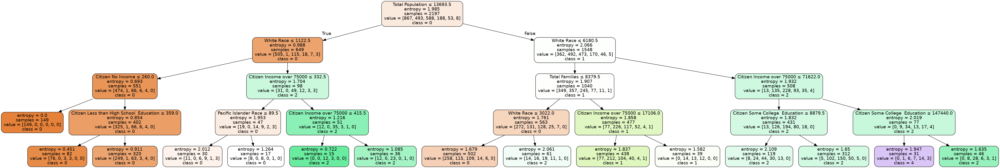

In [50]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf4, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols, class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('deathrate-pruned.png')
Image(graph.create_png())

# Take Away
- Accuracy increased from 0.4565 to 0.5892 after pruning the tree using the criterion "entroy" to increase the information gain and setting the max depth to 3, meaning only 3 levels of the tree will be printed. Overall, the accuracy increased as a result of pruning and the viewer longer has to zoom-in to read the tree.

<a id = "12345678"> <h2> 2.1 Oversampling (SMOTE) </h2> </a>
We oversample the <b> training </b> dataset, because the classes within our target variable 'Revenue' are imbalanced:
* class 0: 84.53%
* class 1: 15.47%

Fore more information, click on detailed information from Prof. Jie Tao [link](https://github.com/DrJieTao/ba545-docs/blob/master/competition2/handling_imbalanced_data_part2.ipynb)

In [ ]:
# Split dataset into training set and test set 
# 70% training and 30% test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3,random_state=2019) 

sm = SMOTE(random_state = 2019) 
X_train_res, y_train_res = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

The SMOTE Algorithm has oversampled the instances in the minority class and made it equal to majority class:
* Both classes (0 & 1) now have 7291 instances, the <b> training </b> dataset is balanced.
* Class 1 increased from 1340 instances to 7291 instances, an increase of 5951 instances of class 1.

In [ ]:
# Create Decision Tree classifer object
clf2 = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf2 = clf2.fit(X_train_res, y_train_res)

#Predict the response for test dataset
y_pred = clf2.predict(X_test)

# print classification report 
print(classification_report(y_test, y_pred))

## Cross Validation Using KFold </b>
For more information on the topic, please click the following [link](https://stackabuse.com/cross-validation-and-grid-search-for-model-selection-in-python/).
<br> The details of the package are noted [here](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html).

<a id = "123456789"> <h2> 2.2 Cross Validation (Oversampling)  </h2> </a>

In [ ]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
#result = cross_val_score(gnb, X, Y, cv=kfold, scoring='accuracy')
result = cross_val_score(clf2, X_train_res, y_train_res, cv=kfold, scoring='accuracy')

print('--------------------------------------------------------------------------')
print('All the accuracy results:')
print('--------------------------------------------------------------------------')
print(result, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the accuracy results:')
print('--------------------------------------------------------------------------')
print(round(result.mean(), 4), '\n')

print('--------------------------------------------------------------------------')
print('Conclusion: the average of the accuracy changed after applying Kfold:')
print('--------------------------------------------------------------------------')
print('from:')
print(round(metrics.accuracy_score(y_test, y_pred), 5))
print('to:')
print(round(result.mean(), 5))
print('This is because we only use: {0:0.2f}% of our dataset to train the model!'.format(((k_fold_split-1)/k_fold_split)*100))

In [ ]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
#result = cross_val_score(clf, X, Y, cv=kfold, scoring='accuracy')
# note: only a single metric is permitted for parameter 'scoring'
# for all parameters for scoring, see source:https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
result_f1_weighted = cross_val_score(clf2, X_train_res, y_train_res, cv=kfold, scoring='f1_weighted')
print('--------------------------------------------------------------------------')
print('All the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(result_f1_weighted, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(round(result_f1_weighted.mean(), 4), '\n')

<a id = "1234567891"> <h2> 2.3 Cross Validation (Undersampling)  </h2> </a>

In [ ]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
result = cross_val_score(clf2, X, Y, cv=kfold, scoring='accuracy')
#result = cross_val_score(clf2, X_train_miss, y_train_miss, cv=kfold, scoring='accuracy')

print('--------------------------------------------------------------------------')
print('All the accuracy results:')
print('--------------------------------------------------------------------------')
print(result, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the accuracy results:')
print('--------------------------------------------------------------------------')
print(round(result.mean(), 4), '\n')

print('--------------------------------------------------------------------------')
print('Conclusion: the average of the accuracy changed after applying Kfold:')
print('--------------------------------------------------------------------------')
print('from:')
print(round(metrics.accuracy_score(y_test, y_pred), 5))
print('to:')
print(round(result.mean(), 5))
print('This is because we only use: {0:0.2f}% of our dataset to train the model!'.format(((k_fold_split-1)/k_fold_split)*100))

In [ ]:
# Build the k-fold cross-validator
k_fold_split = 10
kfold = KFold(n_splits=k_fold_split, random_state=2019, shuffle=True)
#esult = cross_val_score(clf, X, Y, cv=kfold, scoring='accuracy')
# note: only a single metric is permitted for parameter 'scoring'
# for all parameters for scoring, see source:https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
#result_f1_weighted = cross_val_score(clf2, X_train_miss, y_train_miss, cv=kfold, scoring='f1_weighted')
print('--------------------------------------------------------------------------')
print('All the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(result_f1_weighted, '\n')

print('--------------------------------------------------------------------------')
print('Average of all the weighted f1 results:')
print('--------------------------------------------------------------------------')
print(round(result_f1_weighted.mean(), 4), '\n')

<a id = "12345678912"> <h2> 2.4 Model Tuning (Hyperparameters) </h2> </a>
___


<b> Define Grid

In [ ]:
criterion= ['gini', 'entropy'] 
splitter= ['best', 'random'] 
max_depth= [3,5,10] 
param_grid = dict(criterion=criterion, splitter=splitter, max_depth=max_depth)

<b> Hyper-parameter tweaking on oversampled training set

In [ ]:
# set the start time
start = time.time()

# define the model
clf = DecisionTreeClassifier()

# Create a grid search object
grid = GridSearchCV(estimator=clf, param_grid=param_grid, cv = 3, n_jobs=-1)

# Fit the grid search (Fitting your model to the training data)
grid_result = grid.fit(X_train_res, y_train_res)

# define each optimal parameter as a new variable
optimal_criterion = grid.best_estimator_.get_params()['criterion']
optimal_splitter = grid.best_estimator_.get_params()['splitter']
optimal_max_depth = grid.best_estimator_.get_params()['max_depth']

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# get the time it takes for the gridsearch to run
# source: https://blog.softhints.com/python-test-performance-and-measure-time-elapsed-in-seconds/
# set the end time
end = time.time()

# get the elapsed execution time
execution_time = end - start
print("--- Execution time: ---")
print ('--- %0.3fms. --- ' % ( execution_time*1000.))
print("--- %s seconds ---" % (execution_time))
print("--- %s minutes ---" % (execution_time/60))

<b> Applying the optimal hyper-parameters on oversampled training set

In [ ]:
# apply the optimal hyper-parameters to the Logistic Regression Model
clf3 = DecisionTreeClassifier(criterion=optimal_criterion, splitter=optimal_splitter, max_depth=optimal_max_depth)

# fit/train the model with oversampled training set
clf3.fit(X_train_res, y_train_res)

# predict the testing set
y_pred=clf3.predict(X_test)

# print out the classification report
print(classification_report(y_test, y_pred))